In [1]:
import omnipath as op
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pySankey import sankey as sn
import mellon as ml
import networkx as nx
from matplotlib.pyplot import figure
import glob
import netrd
import itertools

c:\Users\melis\AppData\Local\Programs\Python\Python37\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path = glob.glob("processed_data/hot-encoded-diseases_*.csv")
path

['processed_data\\hot-encoded-diseases_0.100000.csv',
 'processed_data\\hot-encoded-diseases_0.200000.csv',
 'processed_data\\hot-encoded-diseases_0.300000.csv',
 'processed_data\\hot-encoded-diseases_0.400000.csv',
 'processed_data\\hot-encoded-diseases_0.500000.csv',
 'processed_data\\hot-encoded-diseases_0.600000.csv',
 'processed_data\\hot-encoded-diseases_0.700000.csv']

(9708, 45)
(8345, 45)
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
FGF6      0.0
NID1      0.0
NLGN1     0.0
FAM3B     0.0
ZPBP2     0.0
Length: 352, dtype: float64


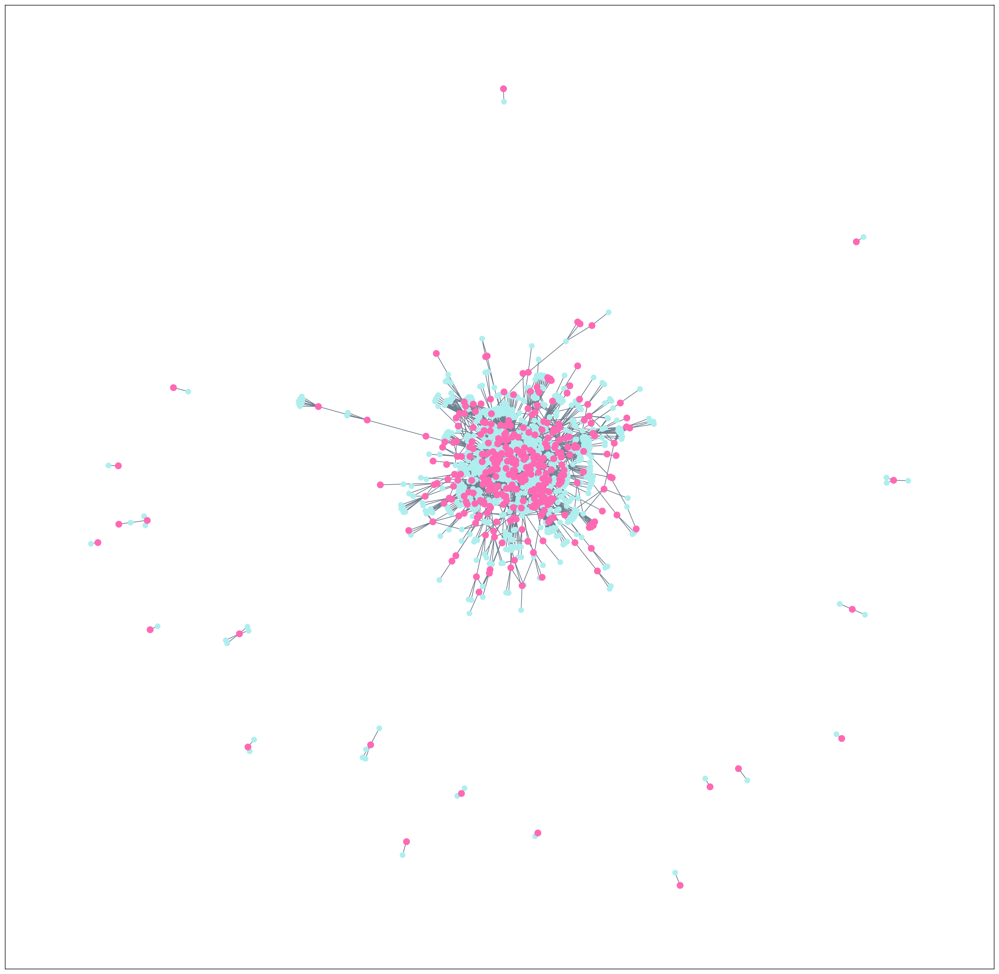

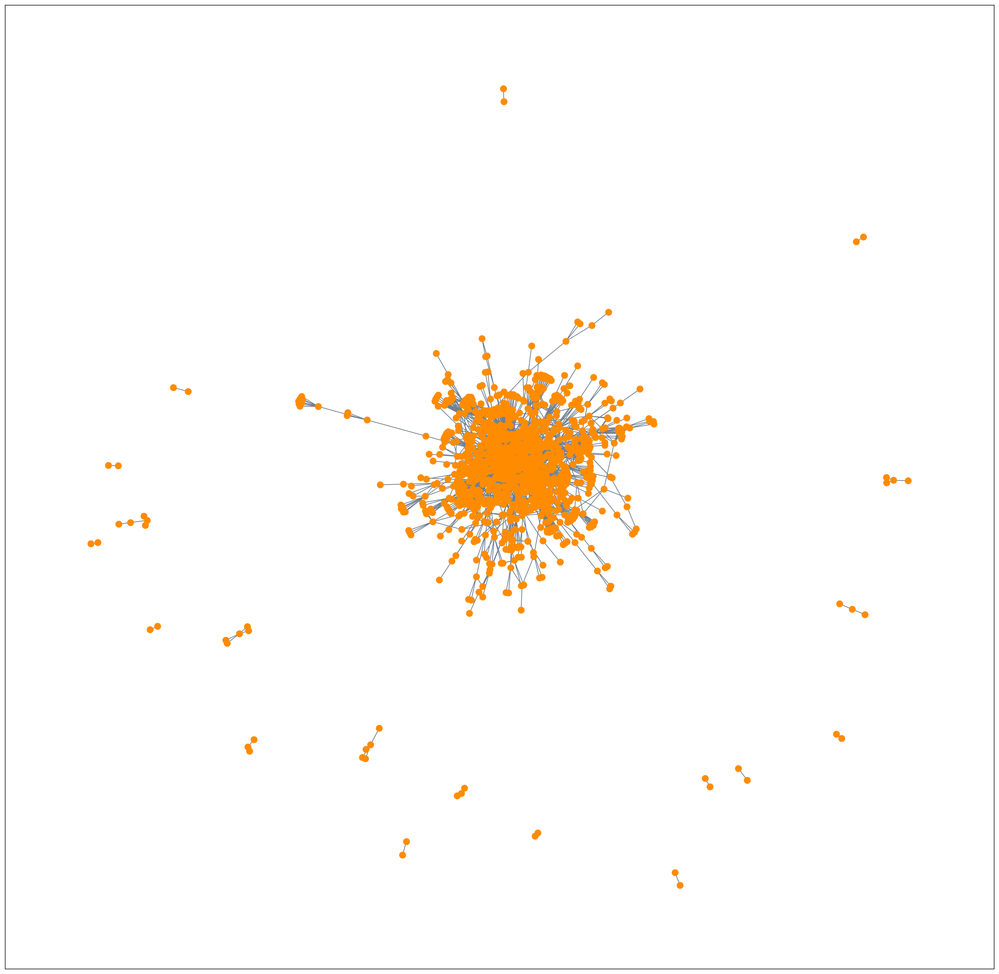

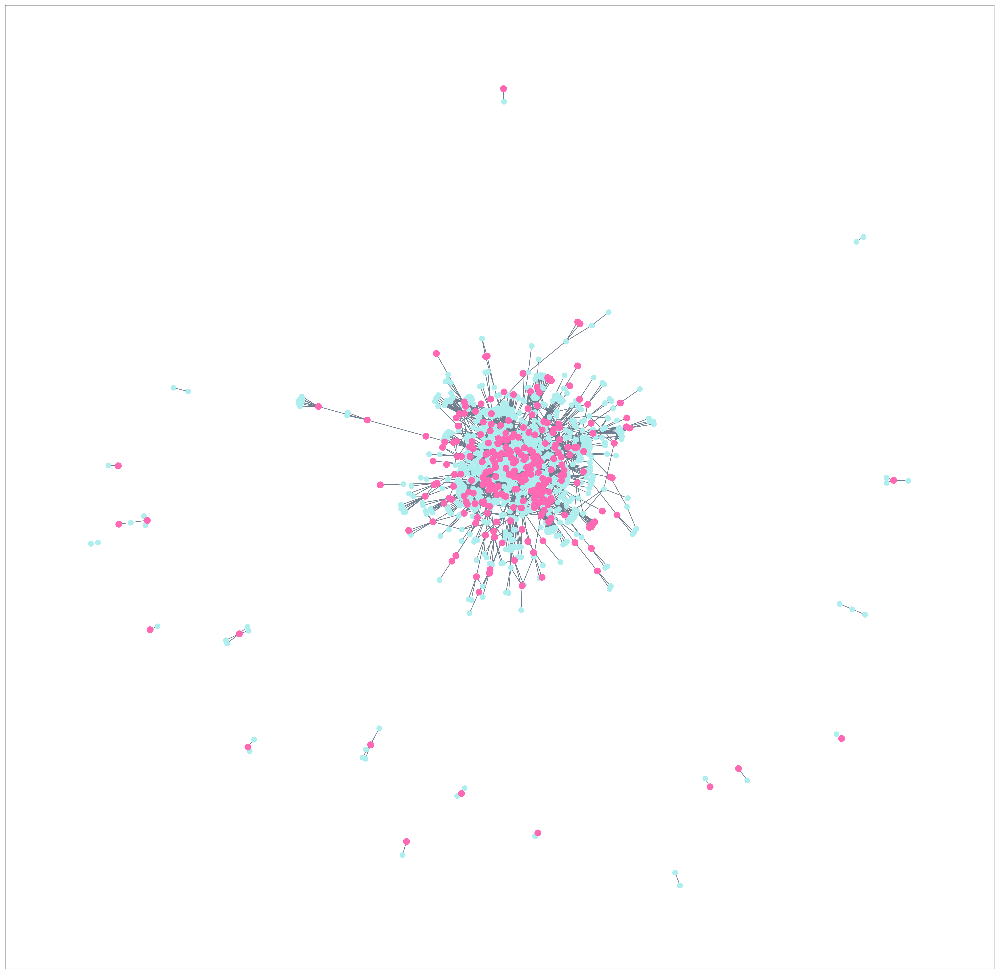

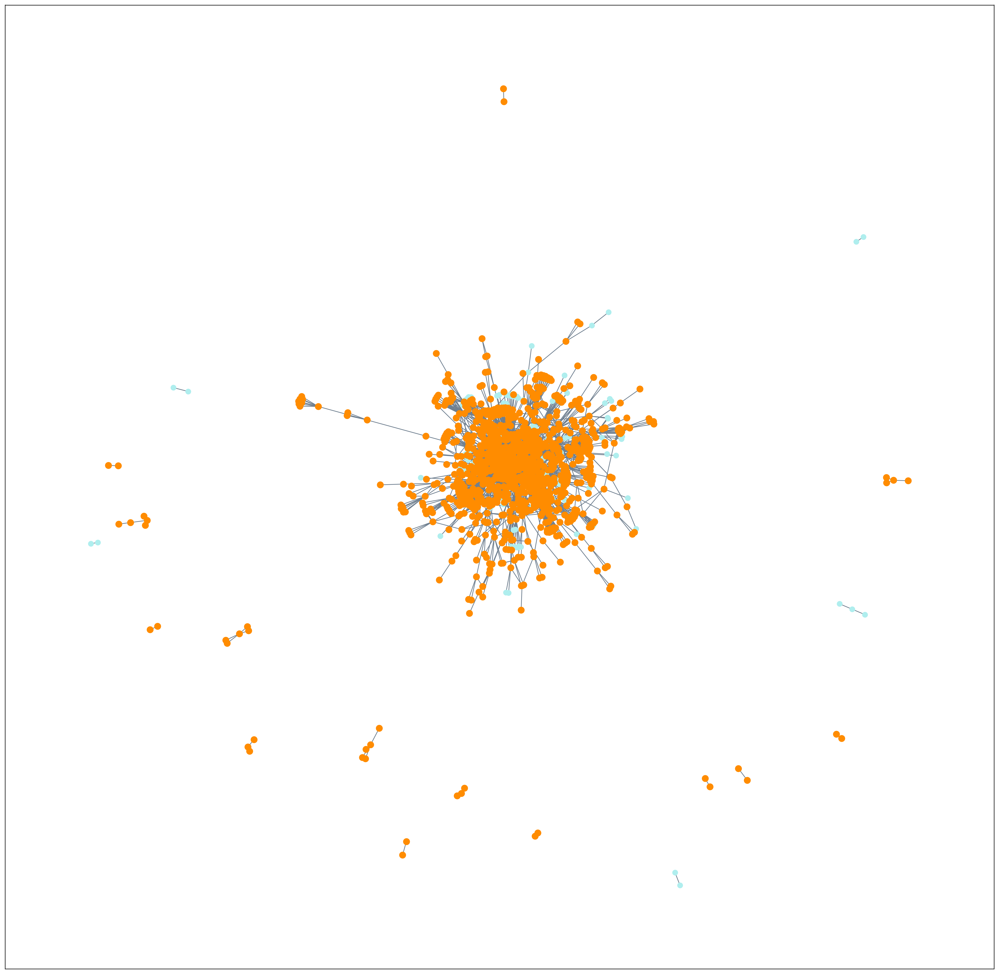

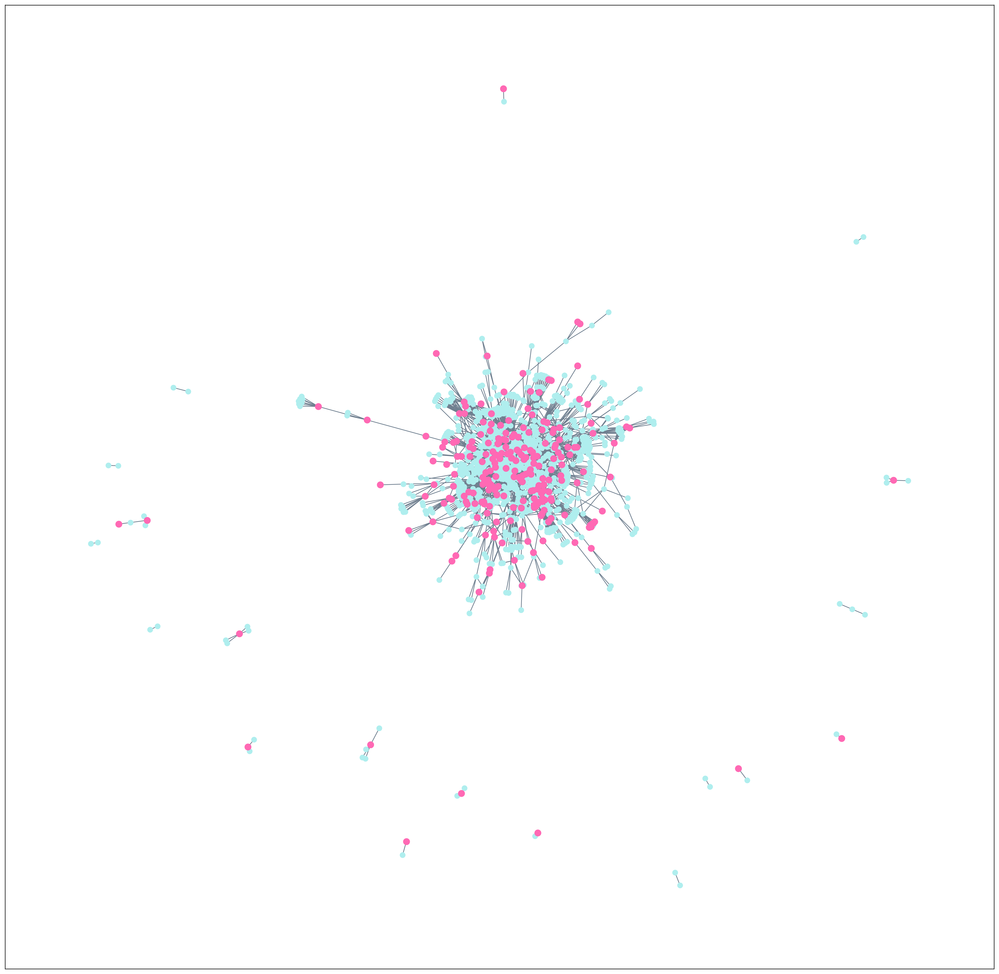

...

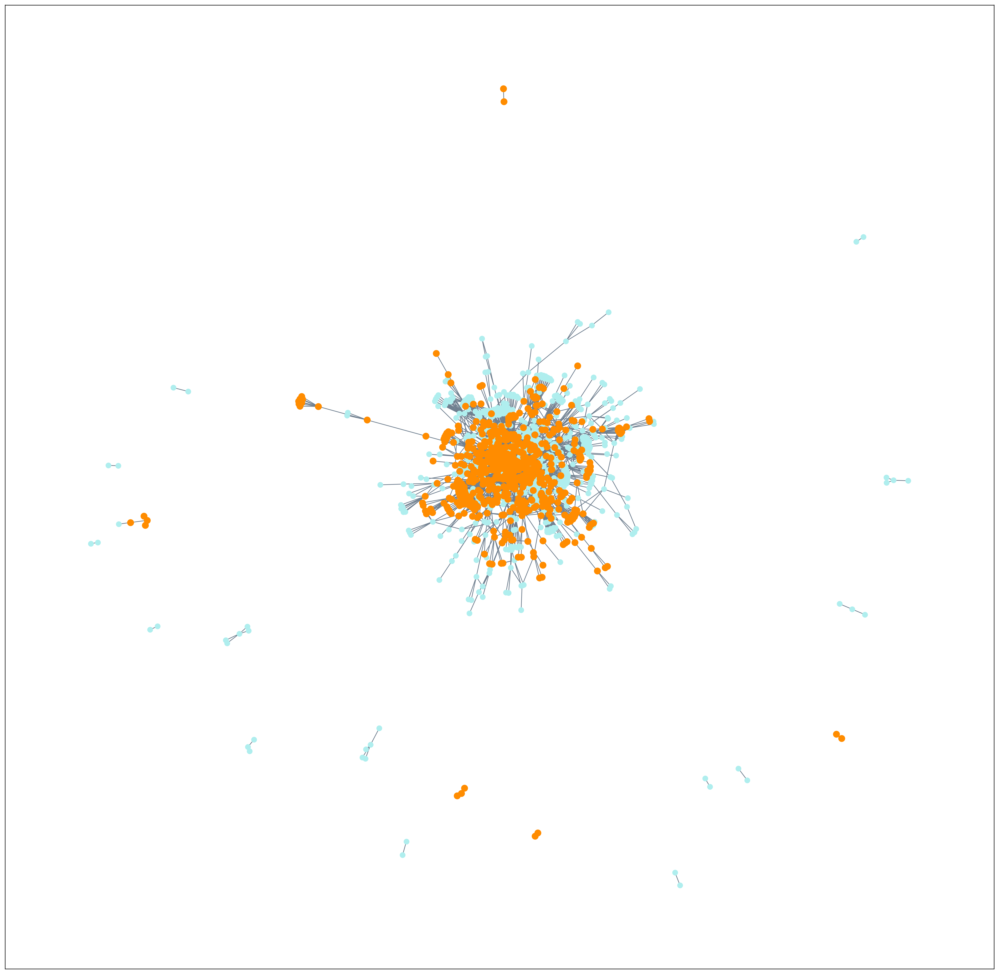

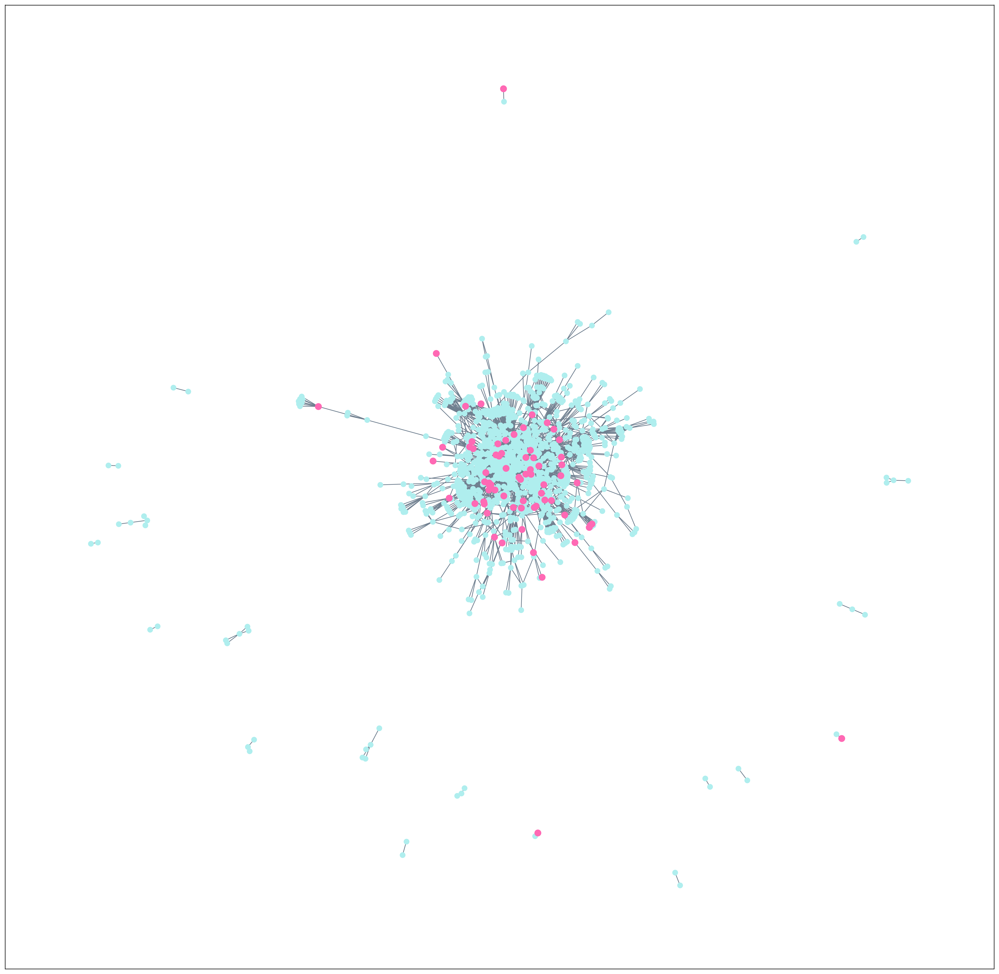

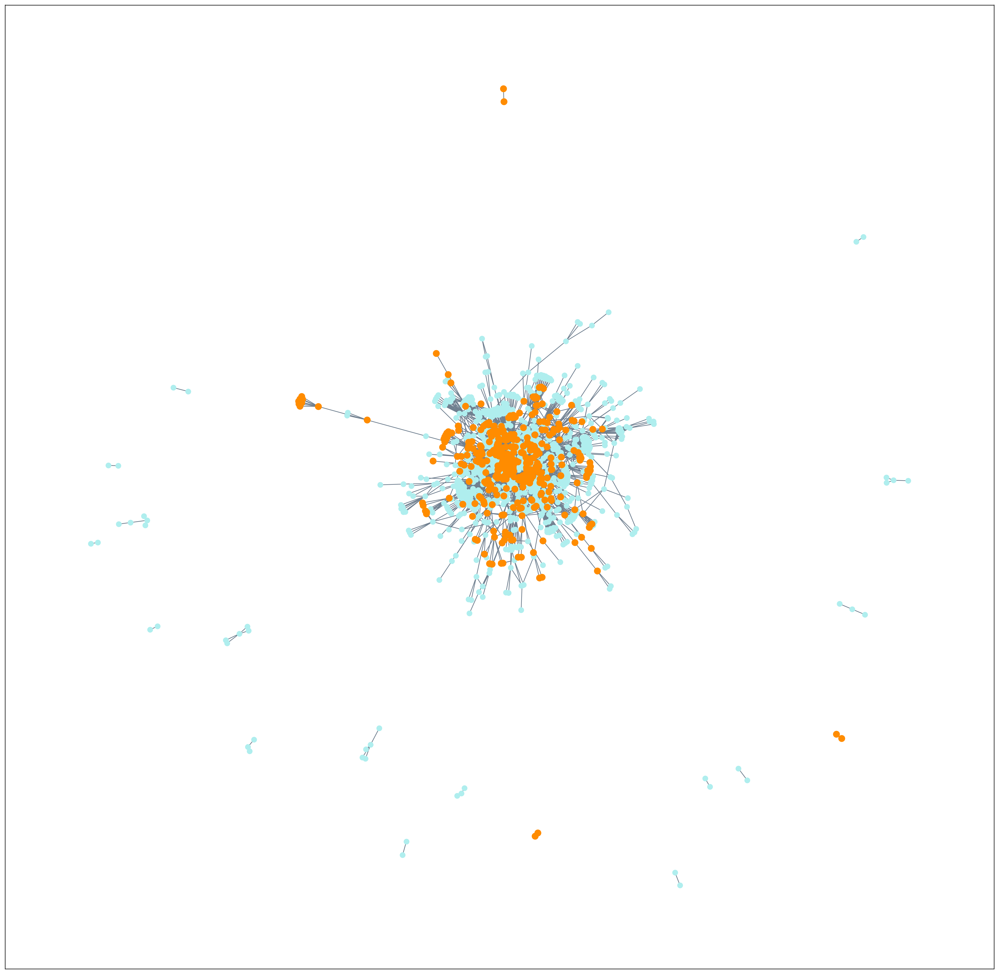

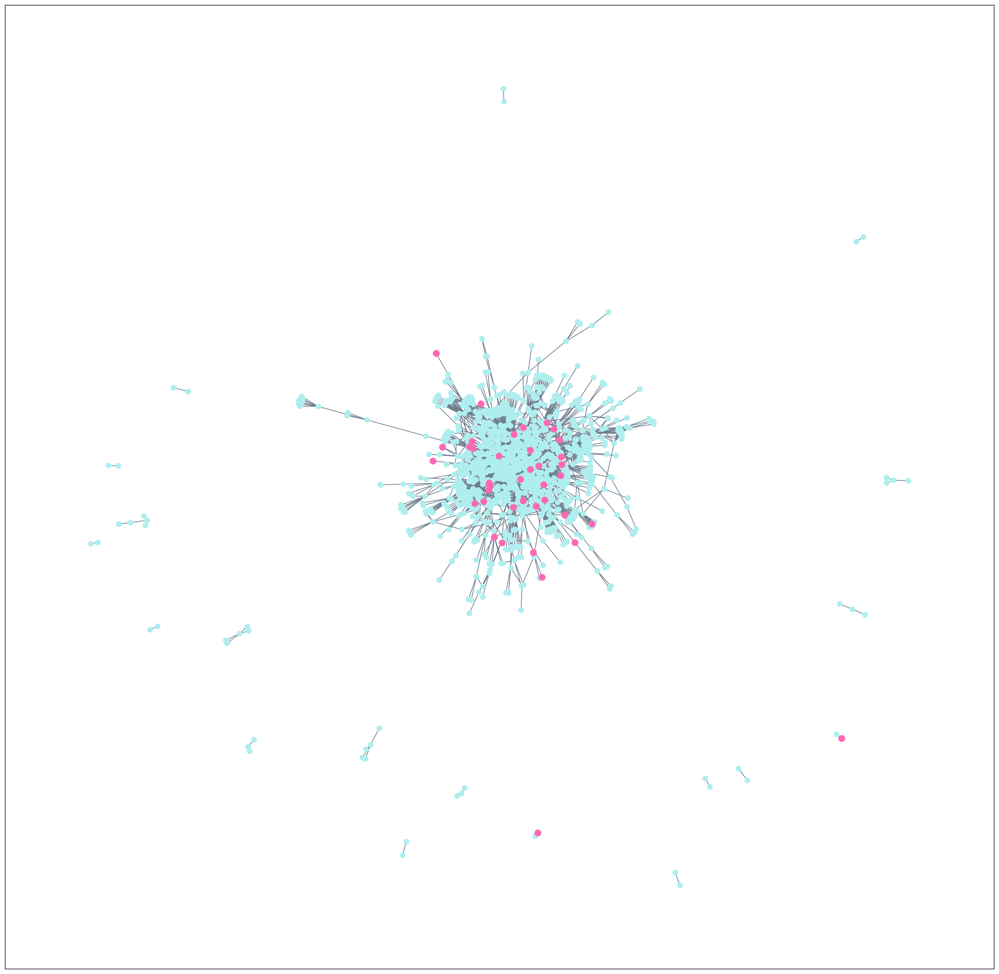

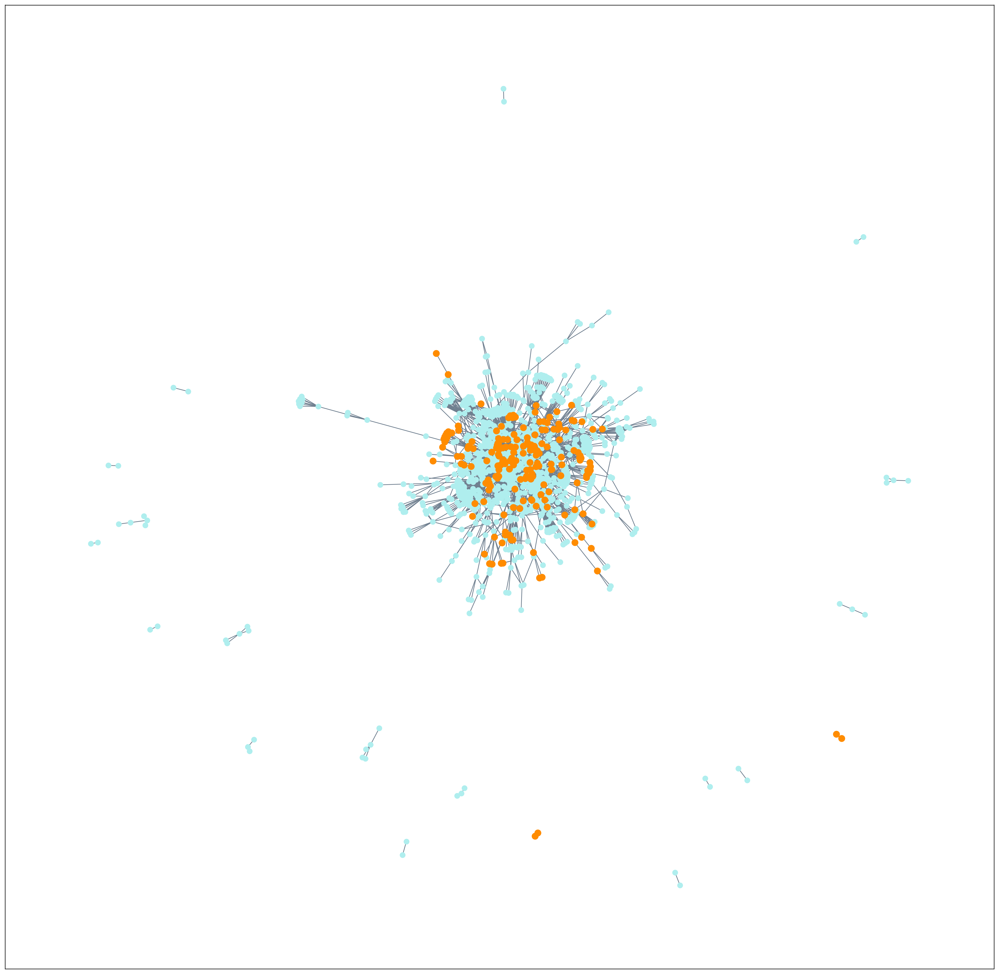

In [15]:
path = glob.glob("processed_data/hot-encoded-diseases_*.csv")

top = pd.read_csv('/Users/melis/Documents/Gene-targets/Disease_gene_associations_OpenTargets/PD_MONDO_0005180-associated-diseases (1).tsv', sep = '\t', index_col = 0)
top = list(top[top['objectObject']>0.4].index)

db = op.interactions.import_intercell_network(transmitter_params = {"categories":"ligand"}, receiver_params = {"categories": "receptor"})
print(np.shape(db))
db = db[np.logical_not(db['genesymbol_intercell_source'].str.startswith('HLA'))]
db = db[np.logical_not(db['genesymbol_intercell_target'].str.startswith('HLA'))]
db = db[~db['genesymbol_intercell_target'].astype(str).str.startswith('COMPLEX')]
db = db[~db['genesymbol_intercell_source'].astype(str).str.startswith('COMPLEX')]
print(np.shape(db))
tgts_all = pd.read_csv('processed_data/hot-encoded-diseases_0.100000.csv')
tgts_all['gene']=tgts_all['genes']
tgts = tgts_all.drop(columns=['genes']).set_index(['gene'])
source, percSrc, targets, percTgt, sum = ml.lr.find_hits(tgts, db)
    
LRs = db[['genesymbol_intercell_source','genesymbol_intercell_target']][(db['genesymbol_intercell_source'].isin(list(sum.gene))) | (db['genesymbol_intercell_target'].isin(list(sum.gene)))]
unique_genes = np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target']))

# Adjacency matrix with entire network across all diseases
adj_LRs = pd.DataFrame(np.zeros(shape=(len(unique_genes), len(unique_genes))), index = unique_genes, columns = unique_genes)
for n in range (0, np.shape(LRs)[0]):
    adj_LRs.iloc[adj_LRs.index.get_loc(LRs.iloc[n]['genesymbol_intercell_source']), adj_LRs.columns.get_loc(LRs.iloc[n]['genesymbol_intercell_target'])] += 1

#Number of cell-cell interactions ligands of interest are involved in
print(adj_LRs.sum(axis = 0).sort_values(ascending=False)[adj_LRs.sum(axis = 0).sort_values(ascending=False).index.isin(list(tgts.index))])

#Number of cell-cell interactions receptors of interest are involved in
adj_LRs.sum(axis = 1).sort_values(ascending=False)[adj_LRs.sum(axis = 1).sort_values(ascending=False).index.isin(list(tgts.index))]

# Overview of LR network and calculating rank of importance with PageRank
H = nx.from_pandas_adjacency(adj_LRs)
pos = nx.spring_layout(H)
for res in range(0,len(path)):
    thresholdGenes = pd.read_csv(path[res])
    PDcolours = []
    for i in H.nodes:
        if i in list(thresholdGenes['genes']):
            PDcolours.append(i)
    len(PDcolours)
    plt.figure(figsize=(25,25), dpi = 300)
    nx.draw_networkx(H, pos, node_color='paleturquoise', edge_color = 'slategrey', with_labels=False, node_size = 50)
    nx.draw_networkx_nodes(H, pos, nodelist = PDcolours, node_color='hotpink', node_size = 75)
    plt.savefig("plots/03-LR_network_visualisation/03i_hotspot_visalisation/cross_threshold_visualisation_01_with_diseasegenes_%s.png" % path[res].split("_")[2].split('.c')[0], dpi = 150)
    plt.show()

    thresholdGenes['gene']=thresholdGenes['genes']
    tgts = thresholdGenes.drop(columns=['genes']).set_index(['gene'])
    source, percSrc, targets, percTgt, sum = ml.lr.find_hits(tgts, db)
    LRs = db[['genesymbol_intercell_source','genesymbol_intercell_target']][(db['genesymbol_intercell_source'].isin(list(sum.gene))) | (db['genesymbol_intercell_target'].isin(list(sum.gene)))]
    unique_genes = np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target']))
    
    PDcolours = []
    for i in H.nodes:
        if i in unique_genes:
            PDcolours.append(i)
    len(PDcolours)
    plt.figure(figsize=(25,25), dpi = 300)
    nx.draw_networkx(H, pos, node_color='paleturquoise', edge_color = 'slategrey', with_labels=False, node_size = 50)
    nx.draw_networkx_nodes(H, pos, nodelist = PDcolours, node_color='darkorange', node_size = 75)
    plt.savefig("plots/03-LR_network_visualisation/03i_hotspot_visalisation/cross_threshold_visualisation_01_with_network_thr%s.png" % path[res].split("_")[2].split('.c')[0], dpi = 150)
    plt.show()